#  Using Fuzzy U-Net Architecture - Segmenting Skin Cancer Images

## 1. Importing required libraries

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import glob as gb
import tensorflow as tf

from sklearn.model_selection import train_test_split

from tensorflow.keras import layers, Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, BatchNormalization, Conv2DTranspose, Activation, add

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.metrics import Precision, Recall, MeanSquaredError

from tensorflow.keras import backend as K

sns.set_theme(style='darkgrid', palette='pastel')

## 2. Checking the dataset if there are enough masks corresponding to the images

In [2]:
# images and masks folder paths
image_dir = '/kaggle/input/ham1000-segmentation-and-classification/images'
mask_dir = '/kaggle/input/ham1000-segmentation-and-classification/masks'

# list of images and masks from the directory
image_files = sorted([f for f in os.listdir(image_dir) if f.endswith('.jpg')])
mask_files = sorted([f for f in os.listdir(mask_dir) if f.endswith('.png')])

# generating lis of image names (without extension) & masks names (without 'segmentation' suffix & extension)
image_names = [os.path.splitext(f)[0] for f in image_files]
mask_names = [os.path.splitext(f)[0].replace('_segmentation', '') for f in mask_files]

# checking if all the images have corresponding masks or not
missing_masks = [img for img in image_names if img not in mask_names]

if len(missing_masks) == 0:
    print('All images have corresponding masks...')
else:
    print(f'No of images that dont have corresponding masks: {len(missing_images)}')

All images have corresponding masks...


## 3. Displaying the images, masks, and masked images

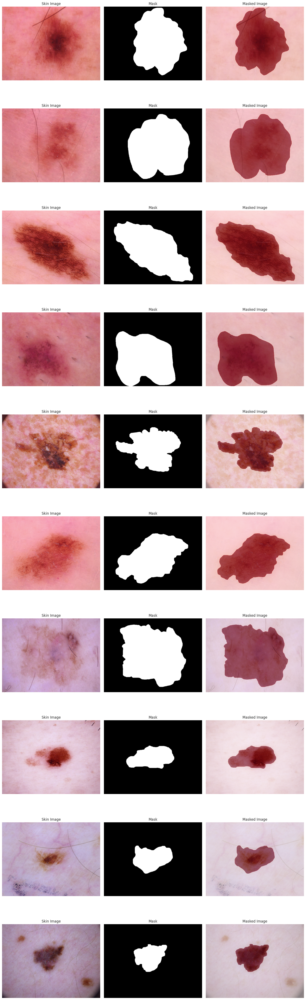

In [3]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import os

def display_images_and_masks(image_dir, mask_dir, num_images=10, display_mode='all'):
    """
    Displays images, masks, and overlaid masked images.
    
    Args:
        image_dir (str): Directory containing images.
        mask_dir (str): Directory containing masks.
        num_images (int): Number of images to display.
        display_mode (str): Display mode. Options:
            - 'all': Display images, masks, and overlaid images.
            - 'side_by_side': Display images and masks side by side.
            - 'masked': Display overlaid masked images only.
    """
    # Filter to only include image files
    valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff')  # Add more as needed
    image_files = [f for f in sorted(os.listdir(image_dir)) if f.lower().endswith(valid_extensions)]
    image_files = image_files[:num_images]  # Limit to the first num_images files
    
    # Prepare the figure
    if display_mode == 'all':
        fig, axes = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))
    elif display_mode == 'side_by_side':
        fig, axes = plt.subplots(num_images, 2, figsize=(10, 5 * num_images))
    elif display_mode == 'masked':
        fig, axes = plt.subplots(1, num_images, figsize=(20, 10))
    else:
        raise ValueError("Invalid display_mode. Choose from 'all', 'side_by_side', or 'masked'.")
    
    for i, file_name in enumerate(image_files):
        # Paths for image and mask
        image_path = os.path.join(image_dir, file_name)
        mask_name = os.path.splitext(file_name)[0] + '_segmentation.png'
        mask_path = os.path.join(mask_dir, mask_name)
        
        # Load image and mask
        try:
            image = Image.open(image_path)
            mask = Image.open(mask_path).convert('L')  # Convert mask to grayscale
        except FileNotFoundError:
            print(f"Mask not found for image: {file_name}")
            continue
        except UnidentifiedImageError:
            print(f"Unidentified image file: {image_path}")
            continue

        image_np = np.array(image)
        mask_np = np.array(mask)
        
        if display_mode in ['all', 'side_by_side']:
            # Display image
            axes[i, 0].imshow(image)
            axes[i, 0].set_title('Skin Image')
            axes[i, 0].axis('off')

            # Display mask
            axes[i, 1].imshow(mask, cmap='gray')
            axes[i, 1].set_title('Mask')
            axes[i, 1].axis('off')
        
        if display_mode in ['all', 'masked']:
            # Display masked image (overlay)
            ax = axes[i, 2] if display_mode == 'all' else axes[i]
            ax.imshow(image_np)
            ax.imshow(mask_np, cmap='Reds', alpha=0.5)
            ax.set_title('Masked Image')
            ax.axis('off')

    plt.tight_layout()
    plt.show()


# Update paths
image_dir = '/kaggle/input/ham1000-segmentation-and-classification/images'
mask_dir = '/kaggle/input/ham1000-segmentation-and-classification/masks'

# Display images and masks
display_images_and_masks(image_dir, mask_dir, num_images=10, display_mode='all')  # All views
# display_images_and_masks(image_dir, mask_dir, num_images=5, display_mode='side_by_side')  # Images and Masks
# display_images_and_masks(image_dir, mask_dir, num_images=5, display_mode='masked')  # Masked Images Only

## 4. Preparing data

In [4]:
# setting the default values
IMG_SIZE = 256
BATCH_SIZE = 32
BUFFER_SIZE = 1000

AUTOTUNE = tf.data.experimental.AUTOTUNE

IMG_DIR = '/kaggle/input/ham1000-segmentation-and-classification/images'
MASK_DIR = '/kaggle/input/ham1000-segmentation-and-classification/masks'

In [5]:
# function to get image path and masks
def image_mask_paths(image_dir, mask_dir):
    images_path = sorted(gb.glob(os.path.join(image_dir, '*.jpg')))
    masks_path = sorted(gb.glob(os.path.join(mask_dir, '*.png')))
    
    images_path = np.array(images_path)
    masks_path = np.array(masks_path)
    
    return images_path, masks_path

images_path, masks_path = image_mask_paths(IMG_DIR, MASK_DIR)

## 5. Dividing dataset into training & validation set

In [6]:
X_train, X_temp, y_train, y_temp = train_test_split(images_path, masks_path, train_size=0.8, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, train_size=0.5, random_state=42)

print(f'Training Samples: {len(X_train)}')
print(f'Validation Samples: {len(X_val)}')
print(f'Testing Samples: {len(X_test)}')

Training Samples: 8012
Validation Samples: 1001
Testing Samples: 1002


In [7]:
# function to loading & preprocessing data

def mapping_function(image_path, mask_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
    img = tf.cast(img, tf.float32)/255.0

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_jpeg(mask, channels=1)
    mask = tf.image.resize(mask, (IMG_SIZE, IMG_SIZE))
    mask = tf.cast(mask, tf.float32) / 255.0 

    return img, mask

# creating training set
train_set = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_set = train_set.map(mapping_function, num_parallel_calls=AUTOTUNE)
train_set = train_set.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)

# creating validation set
validation_set = tf.data.Dataset.from_tensor_slices((X_val, y_val))
validation_set = validation_set.map(mapping_function, num_parallel_calls=AUTOTUNE)
validation_set = validation_set.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)

# creating testing set
test_set = tf.data.Dataset.from_tensor_slices((X_test, y_test))
test_set = test_set.map(mapping_function, num_parallel_calls=AUTOTUNE)
test_set = test_set.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)

In [8]:
print(f'Length of Training Set: {len(train_set)}')
print(f'Length of Validation Set: {len(validation_set)}')
print(f'Length of Testing Set: {len(test_set)}')

Length of Training Set: 251
Length of Validation Set: 32
Length of Testing Set: 32


## 6. Fuzzy U-Net model implementation

In [9]:
def fuzzy_unet(input_shape=(IMG_SIZE, IMG_SIZE, 3)):
    inputs = Input(shape=input_shape)

    x = Conv2D(32, 3, padding="same")(inputs)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    skip_connections = []

    # Encoder
    for filters in [64, 128, 256, 512]:
        x = Conv2D(filters, 3, padding='same')(x)
        x = BatchNormalization()(x)
        x = Activation("relu")(x)

        x = Conv2D(filters, 3, padding='same')(x)
        x = BatchNormalization()(x)
        x = Activation("relu")(x)

        skip_connections.append(x)
        x = MaxPooling2D(2, padding="same")(x)

    # Bottleneck with fuzzy membership calculations
    x = Conv2D(1024, 3, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = Conv2D(1024, 3, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    # Decoder with fuzzy skip connections
    for filters in [512, 256, 128, 64]:
        x = Conv2DTranspose(filters, 2, strides=2, padding="same")(x)

        # Fuzzy attention for skip connections
        skip_connection = skip_connections.pop()
        attention = Conv2D(filters, 1, padding='same', activation='sigmoid')(skip_connection)
        skip_connection = skip_connection * attention  # Fuzzy weighting
        x = add([x, skip_connection])

        x = Conv2D(filters, 3, padding='same')(x)
        x = BatchNormalization()(x)
        x = Activation("relu")(x)

        x = Conv2D(filters, 3, padding='same')(x)
        x = BatchNormalization()(x)
        x = Activation("relu")(x)

    outputs = Conv2D(1, 1, activation="sigmoid")(x)

    model = Model(inputs, outputs)
    return model

# Instantiate the fuzzy U-Net model
model = fuzzy_unet(input_shape=(IMG_SIZE, IMG_SIZE, 3))
# model.summary()

## 7. Loss Functions

In [10]:
# Dice Coefficient
def dice_coefficient(y_true, y_pred, smooth=1):
    intersection = tf.reduce_sum(y_true * y_pred, axis=[1, 2, 3])
    union = tf.reduce_sum(y_true, axis=[1, 2, 3]) + tf.reduce_sum(y_pred, axis=[1, 2, 3])
    dice = (2 * intersection + smooth) / (union + smooth)
    return tf.reduce_mean(dice, axis=0)

# Dice Loss
def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)

# IoU Metric
def iou(y_true, y_pred, smooth=1):
    intersection = tf.reduce_sum(y_true * y_pred, axis=[1, 2, 3])
    union = tf.reduce_sum(y_true, axis=[1, 2, 3]) + tf.reduce_sum(y_pred, axis=[1, 2, 3]) - intersection
    iou_score = (intersection + smooth) / (union + smooth)
    return tf.reduce_mean(iou_score, axis=0)

## 8. Model Compilation

In [11]:
model.compile(
    optimizer=Adam(learning_rate=0.0002), 
    loss=BinaryCrossentropy(), 
    metrics=[
        'binary_accuracy', 
        Precision(name='precision'), 
        Recall(name='recall'), 
        dice_coefficient, 
        iou, 
        MeanSquaredError(name='mse')
    ]
)

## 9. Model Basic Structure

In [12]:
# # Code for plotting the model

# from keras.utils import plot_model
# plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

## 10. Model Summary

In [13]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │     18,496 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 256, 256,  │     36,928 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │    147,584 │ activation_3[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 128, 128,  │          0 │ batch_normalizat

 Total params: 28,288,705 (107.91 MB)

 Trainable params: 28,276,865 (107.87 MB)

 Non-trainable params: 11,840 (46.25 KB)

## 11. Model Training

In [14]:
history = model.fit(
    train_set,
    epochs=15,
    validation_data=validation_set
)

Epoch 1/15


I0000 00:00:1733578136.785007      70 service.cc:145] XLA service 0x7cd184003ab0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733578136.785075      70 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1733578136.785081      70 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1733578230.220984      70 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


251/251 ━━━━━━━━━━━━━━━━━━━━ 638s 2s/step - binary_accuracy: 0.8458 - dice_coefficient: 0.5897 - iou: 0.4490 - loss: 0.3542 - mse: 0.1069 - precision: 0.7255 - recall: 0.7961 - val_binary_accuracy: 0.8582 - val_dice_coefficient: 0.5699 - val_iou: 0.4218 - val_loss: 0.3645 - val_mse: 0.1099 - val_precision: 0.6897 - val_recall: 0.8806
Epoch 2/15
251/251 ━━━━━━━━━━━━━━━━━━━━ 458s 2s/step - binary_accuracy: 0.9397 - dice_coefficient: 0.7598 - iou: 0.6370 - loss: 0.1646 - mse: 0.0435 - precision: 0.9144 - recall: 0.8661 - val_binary_accuracy: 0.9335 - val_dice_coefficient: 0.7769 - val_iou: 0.6579 - val_loss: 0.1771 - val_mse: 0.0478 - val_precision: 0.8737 - val_recall: 0.8890
Epoch 3/15
251/251 ━━━━━━━━━━━━━━━━━━━━ 458s 2s/step - binary_accuracy: 0.9471 - dice_coefficient: 0.8035 - iou: 0.6947 - loss: 0.1383 - mse: 0.0374 - precision: 0.9285 - recall: 0.8790 - val_binary_accuracy: 0.9503 - val_dice_coefficient: 0.8471 - val_iou: 0.7527 - val_loss: 0.1272 - val_mse: 0.0348 - val_precision

## 12. Plotting the results graphs

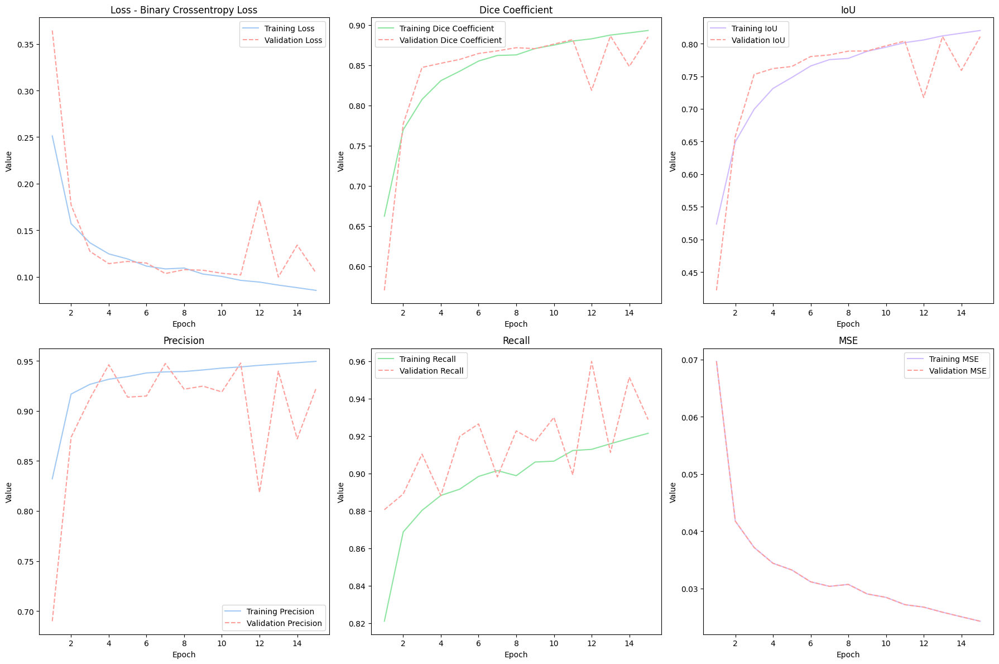

In [15]:
# Function to plot training and validation metrics
def plot_training_metrics(history):
    """
    Plots training and validation metrics for loss, accuracy, IoU, precision, and recall.
    """
    epochs = range(1, len(history.history['loss']) + 1)

    plt.style.use('default')
    
    # Create a figure for all plots
    plt.figure(figsize=(18, 12))

    # Plot Loss
    plt.subplot(2, 3, 1)
    plt.plot(epochs, history.history['loss'], 'b-', label='Training Loss')
    plt.plot(epochs, history.history['val_loss'], 'r--', label='Validation Loss')
    plt.title('Loss - Binary Crossentropy Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Value')
    plt.legend()

    # Plot Dice Coefficient
    plt.subplot(2, 3, 2)
    plt.plot(epochs, history.history['dice_coefficient'], 'g-', label='Training Dice Coefficient')
    plt.plot(epochs, history.history['val_dice_coefficient'], 'r--', label='Validation Dice Coefficient')
    plt.title('Dice Coefficient')
    plt.xlabel('Epoch')
    plt.ylabel('Value')
    plt.legend()

    # Plot IoU
    plt.subplot(2, 3, 3)
    if 'iou' in history.history:
        plt.plot(epochs, history.history['iou'], 'm-', label='Training IoU')
        plt.plot(epochs, history.history['val_iou'], 'r--', label='Validation IoU')
        plt.title('IoU')
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.legend()
    else:
        plt.title('IoU Not Found in History')

    # Plot Precision
    plt.subplot(2, 3, 4)
    if 'precision' in history.history:
        plt.plot(epochs, history.history['precision'], 'b-', label='Training Precision')
        plt.plot(epochs, history.history['val_precision'], 'r--', label='Validation Precision')
        plt.title('Precision')
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.legend()
    else:
        plt.title('Precision Not Found in History')

    # Plot Recall
    plt.subplot(2, 3, 5)
    if 'recall' in history.history:
        plt.plot(epochs, history.history['recall'], 'g-', label='Training Recall')
        plt.plot(epochs, history.history['val_recall'], 'r--', label='Validation Recall')
        plt.title('Recall')
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.legend()
    else:
        plt.title('Recall Not Found in History')


    # Plot MSE
    plt.subplot(2, 3, 6)
    if 'mse' in history.history:
        plt.plot(epochs, history.history['mse'], 'm-', label='Training MSE')
        plt.plot(epochs, history.history['mse'], 'r--', label='Validation MSE')
        plt.title('MSE')
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.legend()
    else:
        plt.title('MSE Not Found in History')

    # Adjust layout for better display
    plt.tight_layout()
    plt.show()

# Example usage
plot_training_metrics(history)

## 13. Model Evaluation using testing dataset

In [16]:
test_loss, test_accuracy, test_precision, test_recall, test_dice, test_iou, test_mse = model.evaluate(test_set)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Precision: {test_precision:.4f}")
print(f"Test Recall: {test_recall:.4f}")
print(f"Test Dice Coefficient: {test_dice:.4f}")
print(f"Test IOU: {test_iou:.4f}")
print(f"Test Mean Squared Error: {test_mse:.4f}")

32/32 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step - binary_accuracy: 0.9573 - dice_coefficient: 0.8799 - iou: 0.8044 - loss: 0.1098 - mse: 0.0299 - precision: 0.9235 - recall: 0.9329
Test Loss: 0.1162
Test Accuracy: 0.9547
Test Precision: 0.9205
Test Recall: 0.9266
Test Dice Coefficient: 0.8767
Test IOU: 0.8000
Test Mean Squared Error: 0.0317


## 14. Displaying Testing Images, Ground Truth Masks & Predicted Masks

In [17]:
def calculating_dice(y_true, y_pred, smooth=1):
    # converting tensors to numpy array (only for y_true)
    y_true_f = y_true.numpy().flatten()
    y_pred_f = y_pred.flatten()
    
    intersection = np.sum(y_true_f * y_pred_f)
    
    dice = (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)
    
    return dice

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


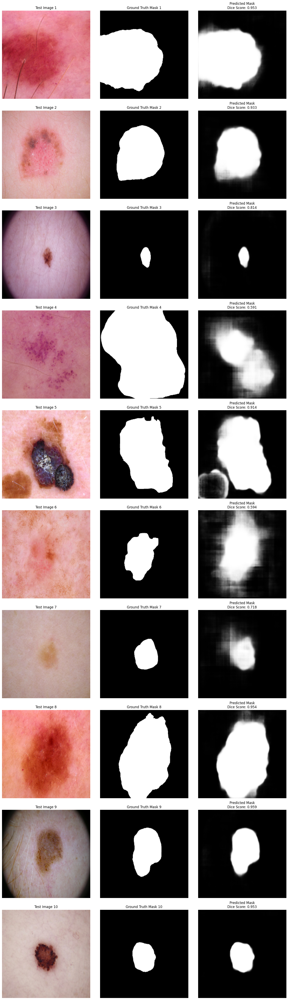

In [18]:
# taking the 1st 10 images for prediction
num_images = 10
test_images, test_masks = next(iter(test_set)) # getting batch images from the generator

# predicting the 1st 10 images
predicted_masks = model.predict(test_images[:num_images])

# displaying the 10 images
plt.figure(figsize=(15, 5 * num_images))

for i in range(num_images):
    dice_score = calculating_dice(test_masks[i], predicted_masks[i])

    # displaying original image
    plt.subplot(num_images, 3, 3*i+1)
    plt.imshow(test_images[i].numpy())
    plt.title(f'Test Image {i+1}')
    plt.axis('off')

    # displaying the ground truth mask
    plt.subplot(num_images, 3, 3*i+2)
    plt.imshow(test_masks[i].numpy().squeeze(), cmap='gray')
    plt.title(f'Ground Truth Mask {i+1}')
    plt.axis('off')
    
    # displaying the predicted mask
    plt.subplot(num_images, 3, 3*i+3)
    plt.imshow(predicted_masks[i].squeeze(), cmap='gray')
    plt.title(f"Predicted Mask\nDice Score: {dice_score:.3f}")
    plt.axis('off')

plt.tight_layout()
plt.show()

## 15. Saving the model

In [19]:
model.save("Skin_cancer_Segmentation.h5")